In [1]:
## TO RUN ON THE CLOUD 

## preprocessed the data before starting the slide
## import embeddings <s
import os

# Define the URI to point to your manual process
os.environ["FIFTYONE_DATABASE_URI"] = "mongodb://localhost:44123"

import fiftyone as fo

# Verify connection
print(fo.core.odm.database.get_db_conn()) 


You are running the oldest supported major version of MongoDB. Please refer to https://deprecation.voxel51.com for deprecation notices. You can suppress this exception by setting your `database_validation` config parameter to `False`. See https://docs.voxel51.com/user_guide/config.html#configuring-a-mongodb-connection for more information
Database(MongoClient(host=['localhost:44123'], document_class=dict, tz_aware=False, connect=True, appname='fiftyone'), 'fiftyone')


In [2]:
import fiftyone as fo

## list all dataset
print(fo.list_datasets())

# Close any zombie sessions that might be hanging
fo.close_app()

['dugong']


In [3]:

from pathlib import Path
import os
import numpy as np
import pandas as pd
import json
from fiftyone import ViewField as F
import matplotlib.pyplot as plt
import numpy as np


## renders plotly properly in a html instance. 
import plotly.io as pio
pio.renderers.default = "notebook"

# Meeting 11/05

In [4]:
# load dataset
dataset = fo.load_dataset("dugong")

In [ ]:
# Verify they exist before deleting
existing = list(dataset.get_field_schema().keys())
to_delete = [f for f in fields_to_delete if f in existing]
missing   = [f for f in fields_to_delete if f not in existing]

if missing:
    print(f"WARNING — not found, will skip: {missing}")

print(f"Deleting {len(to_delete)} fields: {to_delete}")
y = input("proceed? [y]")
if y=='y':
    print(f"deleting samples")
    # Delete
    dataset.delete_sample_fields(to_delete)
else:
    break

Deleting 16 fields: ['NWW_ACLR_partition_10_SEED63_augm_0503_1735_raw', 'NWW_ACLR_partition_10_SEED63_augm_0503_1735_nms', 'NWW_ACLR_partition_25_SEED63_augm_0503_1739_raw', 'NWW_ACLR_partition_25_SEED63_augm_0503_1739_nms', 'NWW_ACLR_partition_50_SEED63_augm_0503_1740_raw', 'NWW_ACLR_partition_50_SEED63_augm_0503_1740_nms', 'NWW_ACLR_partition_5_SEED63_augm_0503_1735_raw', 'NWW_ACLR_partition_5_SEED63_augm_0503_1735_nms', 'NWW_ACLR_partition_75_SEED63_augm_0503_1740_raw', 'NWW_ACLR_partition_75_SEED63_augm_0503_1740_nms', 'NWW_partition_100_SEED63_augm_0502_1111_raw', 'NWW_partition_100_SEED63_augm_0502_1111_nms', 'NWW_partition_10_SEED63_augm_0501_2307_raw', 'NWW_partition_10_SEED63_augm_0501_2307_nms', 'NWW_partition_5_SEED63_augm_0501_2307_raw', 'NWW_partition_5_SEED63_augm_0501_2307_nms']


In [5]:
## load views
nc_view = dataset.load_saved_view('nc')
wp_view = dataset.load_saved_view('wp')

## load saved test view
test_view_seed0 = dataset.load_saved_view('wp_test_s0')
test_view_seed63 = dataset.load_saved_view('wp_test_s63')

In [ ]:
# CREATE AND SAVE VIEW
# wp_test_s63 = (dataset
#     .match_tags("test_63")
#     .match(F("region") == "WP")
# )

# dataset.save_view("wp_test_s63", wp_test_s63)

# print(dataset.list_views())

In [17]:
dataset.list_evaluations()

['ACLR_p10_SEED0_nms',
 'ACLR_p25_SEED0_nms',
 'ACLR_p50_SEED0_nms',
 'ACLR_p5_SEED0_nms',
 'ACLR_p75_SEED0_nms',
 'baseline_SEED0_nms',
 'p100_SEED0_nms',
 'p10_SEED0_nms',
 'p25_SEED0_nms',
 'p50_SEED0_nms',
 'p5_SEED0_nms',
 'p75_SEED0_nms']

In [44]:
dataset.delete_evaluations()

# Pipeline 

How the West Papua was partitioned and process for each seed

In [19]:
## Which are the flight missions used for test on seed 0?
print(f"Number of iamges on test size:{len(test_view_seed0)}")
test_view_seed0.distinct('stratify_key')

Number of iamges on test size:103


['WP_FRIWEN_FRIWEN_M12', 'WP_FRIWEN_FRIWEN_M53', 'WP_MANTASANDY_MANTASANDY_M5']

In [6]:
## Which are the flight missions used for test on seed 0?
print(f"Number of iamges on test size:{len(test_view_seed63)}")
test_view_seed63.distinct('stratify_key')

Number of iamges on test size:104


['WP_FRIWEN_FRIWEN_M19',
 'WP_FRIWEN_FRIWEN_M8',
 'WP_GAM_GAM_M10',
 'WP_MANTASANDY_MANTASANDY_M5',
 'WP_UM_UM_M1']

# Recalling Active Learning

! Add an image 

# Retrieve models

In [10]:
lll = dataset.get_field_schema().keys()
lll

odict_keys(['id', 'filepath', 'tags', 'metadata', 'created_at', 'last_modified_at', 'region', 'subregion', 'mission_name', 'sea_state', 'turbidity_global', 'turbidity_local', 'sun_glitter', 'cloud_reflection', 'habitat_type', 'background_complexity', 'coral', 'sand', 'dense_seagrass', 'open_sea', 'sparse_seagrass', 'ground_truth', 'full_embeddings', 'full_emb_tsne_dinov3', 'uniqueness', 'flight_plan', 'audit', 'stratify_key', 'roi_grid', 'new_stratify_key', 'stem_filepath', 'NNN_WP_SEED0_conf_50_raw', 'NNN_WP_SEED0_conf_50_nms', 'NNN_WP_SEED63_augm_0430_1748conf_50_raw', 'NNN_WP_SEED63_augm_0430_1748conf_50_nms', 'NWW_ACLR_partition_10_SEED63_augm_0503_1735_raw', 'NWW_ACLR_partition_10_SEED63_augm_0503_1735_nms', 'NWW_ACLR_partition_25_SEED63_augm_0503_1739_raw', 'NWW_ACLR_partition_25_SEED63_augm_0503_1739_nms', 'NWW_ACLR_partition_50_SEED63_augm_0503_1740_raw', 'NWW_ACLR_partition_50_SEED63_augm_0503_1740_nms', 'NWW_ACLR_partition_5_SEED63_augm_0503_1735_raw', 'NWW_ACLR_partition_5_S

# Optimal Threshold

Put here the image with Equal Error Rate and with F1 optimal threshold

The choice was F1 optimal.

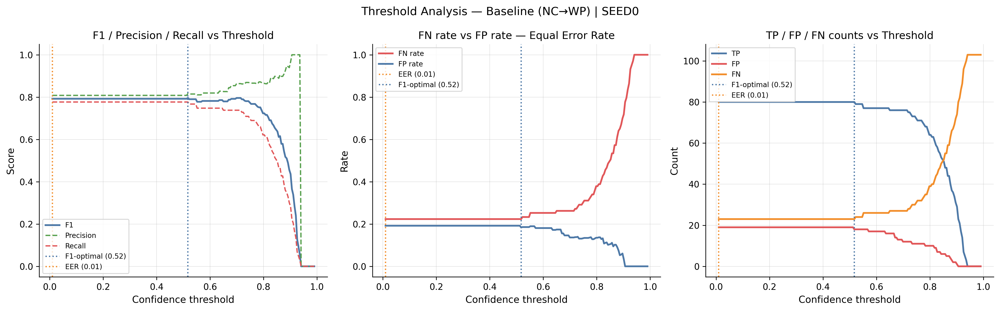


In [16]:
df_seed0_eval = pd.read_csv('/share/home/e2406743/code/Dugongs_IRISA-MARBEC-LIRMM/results/evaluation/evaluation_all_runs_seed0.csv')
df_seed0_eval

,Unnamed: 0,seed,eval_key,mAP,mAR,threshold,f1,precision,recall,tp,fp,fn,n_gt
0,0,0,ACLR_p10_SEED0_nms,0.735509,0.810680,0.842261,0.925234,0.891892,0.961165,99,12,4,103
1,1,0,ACLR_p25_SEED0_nms,0.735868,0.802913,0.861960,0.932039,0.932039,0.932039,96,7,7,103
2,2,0,ACLR_p50_SEED0_nms,0.760379,0.819417,0.857035,0.947368,0.933962,0.961165,99,7,4,103
3,3,0,ACLR_p5_SEED0_nms,0.703725,0.783495,0.857035,0.907407,0.867257,0.951456,98,15,5,103
4,4,0,ACLR_p75_SEED0_nms,0.763416,0.831068,0.886583,0.960784,0.970297,0.951456,98,3,5,103
5,5,0,p100_SEED0_nms,0.759095,0.832039,0.891508,0.942857,0.925234,0.961165,99,8,4,103
6,6,0,p10_SEED0_nms,0.692694,0.775728,0.916131,0.866310,0.964286,0.786408,81,3,22,103
7,7,0,p25_SEED0_nms,0.728966,0.795146,0.842261,0.919431,0.898148,0.941748,97,11,6,103
8,8,0,p50_SEED0_nms,0.757307,0.816505,0.891508,0.927536,0.923077,0.932039,96,8,7,103
9,9,0,p5_SEED0_nms,0.645778,0.733010,0.778241,0.862385,0.817391,0.912621,94,21,9,103


In [8]:
which_seed = "_SEED0_"
all_fields = dataset.get_field_schema().keys()
seed0_fields = [f for f in all_fields if which_seed in f]

seed0_fields_raw = [f for f in seed0_fields if "raw" in f]
seed0_fields_nms = [f for f in seed0_fields if "nms" in f]
seed0_fields_excluding_evaluation = [
    f for f in seed0_fields if not any(x in f for x in ['tp', 'tn', 'fp','fn'])
]
seed0_fields_excluding_evaluation

['NWW_ACLR_partition_10_SEED0_augm_0429_1026_raw',
 'NWW_ACLR_partition_10_SEED0_augm_0429_1026_nms',
 'NWW_ACLR_partition_25_SEED0_augm_0430_0302_raw',
 'NWW_ACLR_partition_25_SEED0_augm_0430_0302_nms',
 'NWW_ACLR_partition_50_SEED0_augm_0430_0357_raw',
 'NWW_ACLR_partition_50_SEED0_augm_0430_0357_nms',
 'NWW_ACLR_partition_5_SEED0_augm_0429_0948_raw',
 'NWW_ACLR_partition_5_SEED0_augm_0429_0948_nms',
 'NWW_ACLR_partition_75_SEED0_augm_0430_0525_raw',
 'NWW_ACLR_partition_75_SEED0_augm_0430_0525_nms',
 'NWW_partition_100_SEED0_augm_0429_0941_raw',
 'NWW_partition_100_SEED0_augm_0429_0941_nms',
 'NWW_partition_10_SEED0_augm_0429_0445_raw',
 'NWW_partition_10_SEED0_augm_0429_0445_nms',
 'NWW_partition_25_SEED0_augm_0429_0531_raw',
 'NWW_partition_25_SEED0_augm_0429_0531_nms',
 'NWW_partition_50_SEED0_augm_0429_0704_raw',
 'NWW_partition_50_SEED0_augm_0429_0704_nms',
 'NWW_partition_5_SEED0_augm_0429_0140_raw',
 'NWW_partition_5_SEED0_augm_0429_0140_nms',
 'NWW_partition_75_SEED0_augm_04

In [14]:
## load the views
#nc_view = dataset.load_saved_view("nc")
#wp_view = dataset.load_saved_view("wp")
## launch session
session = fo.launch_app(dataset,
                        port=5151,
                        auto=False)

Session launched. Run `session.show()` to open the App in a cell output.


# Evaluation

In [9]:
## HELPERS FUNCTIONS
def create_eval_key_name(ds_field_name):
    splits = ds_field_name.split('_')

    if 'ACLR' in splits:
        part = splits[3]
        seed = splits[4]
        raw = splits[-1]
        return f"ACLR_p{part}_{seed}_{raw}"
    else:
        part = splits[2]
        seed = splits[3]
        raw = splits[-1]
        return f"p{part}_{seed}_{raw}"


def filter_ops(all_op, nms_or_raw=None, seed_term=None):
    def match(op):
        tokens = op.split('_')

        if nms_or_raw and nms_or_raw not in tokens:
            return False

        if seed_term and seed_term not in tokens:
            return False

        return True

    return [op for op in all_op if match(op)]


def select_evaluation_list(
    all_op,
    nms_or_raw='raw',
    baseline_field='baseline',
    seed_term=None,  
):
    nms_or_raw = nms_or_raw.strip().lower()

    evaluation_list = filter_ops(
        all_op,
        nms_or_raw=nms_or_raw,
        seed_term=seed_term
    )

    models_ft = [
        {
            "pred_field": r,
            "eval_key": create_eval_key_name(r),
        }
        for r in evaluation_list
    ]

    if nms_or_raw not in {"raw", "nms"}:
        raise ValueError(f"Invalid nms_or_raw value: {nms_or_raw}")

    models_ft.append({
        "pred_field": baseline_field,
        "eval_key": f"baseline_{seed_term}_{nms_or_raw}",
    })

    return models_ft

In [10]:
sss_seed0 = select_evaluation_list(
    all_op= seed0_fields_excluding_evaluation,
    nms_or_raw='nms',
     seed_term='SEED0',
    baseline_field='NNN_NC_SEED0_augm_0422_2254conf_50_nms'
)
# sss_seed63 = select_evaluation_list(
#     all_op= all_op,
#     nms_or_raw='nms',
#      seed_term='SEED63',
#     baseline_field='NNN_WP_SEED63_augm_0430_1748conf_50_nms'
# )

In [11]:
# check for duplicates
from collections import Counter
pred_fields = [d['pred_field'] for d in sss_seed0]
dups = [k for k, v in Counter(pred_fields).items() if v > 1]

print(f"WARNING: THERE IS DUPLICATED FIELD: {dups}")

In [12]:
# DROP DUPLICATE AND LEAVE BASELINE
seen = {}

for item in sss_seed0:
    key = item['pred_field']
    
    if key not in seen:
        seen[key] = item
    else:
        # if duplicate exists, prefer baseline
        if "baseline" in item['eval_key']:
            seen[key] = item
        elif "baseline" not in seen[key]['eval_key']:
            # neither is baseline → keep first (do nothing)
            pass
        # else: existing is baseline → ignore current duplicate

sss_seed0 = list(seen.values())
sss_seed0

[{'pred_field': 'NWW_ACLR_partition_10_SEED0_augm_0429_1026_nms',
  'eval_key': 'ACLR_p10_SEED0_nms'},
 {'pred_field': 'NWW_ACLR_partition_25_SEED0_augm_0430_0302_nms',
  'eval_key': 'ACLR_p25_SEED0_nms'},
 {'pred_field': 'NWW_ACLR_partition_50_SEED0_augm_0430_0357_nms',
  'eval_key': 'ACLR_p50_SEED0_nms'},
 {'pred_field': 'NWW_ACLR_partition_5_SEED0_augm_0429_0948_nms',
  'eval_key': 'ACLR_p5_SEED0_nms'},
 {'pred_field': 'NWW_ACLR_partition_75_SEED0_augm_0430_0525_nms',
  'eval_key': 'ACLR_p75_SEED0_nms'},
 {'pred_field': 'NWW_partition_100_SEED0_augm_0429_0941_nms',
  'eval_key': 'p100_SEED0_nms'},
 {'pred_field': 'NWW_partition_10_SEED0_augm_0429_0445_nms',
  'eval_key': 'p10_SEED0_nms'},
 {'pred_field': 'NWW_partition_25_SEED0_augm_0429_0531_nms',
  'eval_key': 'p25_SEED0_nms'},
 {'pred_field': 'NWW_partition_50_SEED0_augm_0429_0704_nms',
  'eval_key': 'p50_SEED0_nms'},
 {'pred_field': 'NWW_partition_5_SEED0_augm_0429_0140_nms',
  'eval_key': 'p5_SEED0_nms'},
 {'pred_field': 'NWW_p

In [13]:
# Reload evaluation
results_seed0 = {}
for model in sss_seed0:
    results_seed0[model['eval_key']] = dataset.load_evaluation_results(model['eval_key'])
results_seed0

{'ACLR_p10_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc6022e05d0>,
 'ACLR_p25_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc60123d9d0>,
 'ACLR_p50_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc60124b210>,
 'ACLR_p5_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc602359810>,
 'ACLR_p75_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc601249110>,
 'p100_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc60125d550>,
 'p10_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc601249d90>,
 'p25_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc600f489d0>,
 'p50_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc60125d950>,
 'p5_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc600f4a750>,
 'p75_SEED0_nms': <fiftyone.utils.eval.coco.COCODetectionResults at 0x7fc60125f510>,
 'baseline_SEED0_nms': <fiftyone.utils.ev

In [ ]:
results_seed63 = {}
for model in sss_seed63:
    results_seed63[model['eval_key']] = dataset.load_evaluation_results(model['eval_key'])
results_seed63

## Precision-Recall Curve

In [14]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

def plot_pr_curves_plotly(
    results: dict,
    df_metrics: pd.DataFrame = None,   # ← add this
    model_labels: dict = None,
    iou_idx: int = 0,
    title: str = "Precision-Recall | F1 Optimal Threshold",
    save_path: str = None,
):
    n      = len(results)
    colors = px.colors.sample_colorscale("Turbo", [i / (n - 1) for i in range(n)])

    fig = go.Figure()

    for (eval_key, res), color in zip(results.items(), colors):
        label = model_labels.get(eval_key, eval_key) if model_labels else eval_key
        prec  = res.precision[iou_idx, 0, :]
        rec   = res.recall
        valid = prec >= 0
        ap    = res.mAP()

        # ── PR curve ──────────────────────────────────────────────────────
        fig.add_trace(go.Scatter(
            x=rec[valid],
            y=prec[valid],
            mode="lines",
            name=f"{label} (mAP={ap:.2f})",
            line=dict(color=color, width=2),
            legendgroup=eval_key,
            hovertemplate=(
                f"<b>{label}</b><br>"
                "Recall: %{x:.3f}<br>"
                "Precision: %{y:.3f}<br>"
                f"mAP: {ap:.3f}"
                "<extra></extra>"
            ),
        ))

        # ── F1-optimal star marker ─────────────────────────────────────────
        if df_metrics is not None and eval_key in df_metrics["eval_key"].values:
            row       = df_metrics[df_metrics["eval_key"] == eval_key].iloc[0]
            f1_prec   = row["precision"]
            f1_rec    = row["recall"]
            f1_val    = row["f1"]
            f1_thresh = row["threshold"]

            fig.add_trace(go.Scatter(
                x=[f1_rec],
                y=[f1_prec],
                mode="markers",
                marker=dict(symbol="circle-dot", size=5, color=color,
                            line=dict(color="black", width=0.5)),
                legendgroup=eval_key,
                showlegend=True,
                name=f"F1={f1_val:.2f} @ thresh={f1_thresh:.2f}",
                hovertemplate=(
                    f"<b>{label} — F1 optimal</b><br>"
                    f"Threshold: {f1_thresh:.3f}<br>"
                    f"Precision: {f1_prec:.3f}<br>"
                    f"Recall: {f1_rec:.3f}<br>"
                    f"F1: {f1_val:.3f}<br>"
                    f"TP={int(row['tp'])}  FP={int(row['fp'])}  FN={int(row['fn'])}"
                    "<extra></extra>"
                ),
            ))

    fig.update_layout(
        title=dict(text=title, font=dict(size=16)),
        xaxis=dict(title="Recall", range=[0, 1], showgrid=True,
                   gridwidth=0.5, gridcolor="lightgrey"),
        yaxis=dict(title="Precision", range=[0, 1], showgrid=True,
                   gridwidth=0.5, gridcolor="lightgrey"),
        legend=dict(x=1.02, y=1, xanchor="left", font=dict(size=10)),
        width=850, height=650,
        plot_bgcolor="white",
        paper_bgcolor="white",
    )

    if save_path:
        fig.write_html(save_path)

    fig.show()

### Seed 0

In [18]:
model_labels = {
    "baseline_SEED0_nms": "Baseline",
    "p5_SEED0_nms":      "Random 5%",
    "p10_SEED0_nms":     "Random 10%",
    "p25_SEED0_nms":     "Random 25%",
    "p50_SEED0_nms":     "Random 50%",
    "p75_SEED0_nms":     "Random 75%",
    "p100_SEED0_nms":    "Random 100%",
    "ACLR_p5_SEED0_nms":  "ACLR 5%",
    "ACLR_p10_SEED0_nms": "ACLR 10%",
    "ACLR_p25_SEED0_nms": "ACLR 25%",
    "ACLR_p50_SEED0_nms": "ACLR 50%",
    "ACLR_p75_SEED0_nms": "ACLR 75%",
}
plot_pr_curves_plotly(
    results       = results_seed0,
    df_metrics    = df_seed0_eval,      
    model_labels  = model_labels,
    title         = "PR Curves @ IoU=0.50 — SEED 0",
    #save_path     = "pr_curves_f1optimal_seed0.html",
)

## PR curves on a grid plot

In [45]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_pr_curves_partitions(
    results: dict,
    df_metrics: pd.DataFrame,
    partitions: list = ["5", "10", "25", "50", "75"],
    iou_idx: int = 0,
    seed: int = 0,
    title: str = "PR Curves @ IoU=0.50 — Baseline vs Random vs ACLR per Partition",
    save_path: str = None,
):
    COLOR_BASELINE = "#888888"
    COLOR_RANDOM   = "#4e79a7"
    COLOR_ACLR     = "#e15759"

    fig, axes = plt.subplots(1, len(partitions),
                              figsize=(5 * len(partitions), 5),
                              sharey=True)

    def get_f1_label(eval_key, base_label):
        """Append F1 and threshold info from df_metrics to the legend label."""
        if df_metrics is not None and eval_key in df_metrics["eval_key"].values:
            row   = df_metrics[df_metrics["eval_key"] == eval_key].iloc[0]
            return (f"{base_label}\n"
                    f"mAP={row['mAP']:.2f}  F1={row['f1']:.2f}\n"
                    f"P={row['precision']:.2f}  R={row['recall']:.2f}  "
                    f"@t={row['threshold']:.2f}")
        # fallback if eval_key not in df
        ap = results[eval_key].mAP()
        return f"{base_label} (mAP={ap:.2f})"

    for ax, p in zip(axes, partitions):
        subset = [
            ("baseline_SEED0_nms",       "Baseline", COLOR_BASELINE),
            (f"p{p}_SEED{seed}_nms",     f"Random {p}%",     COLOR_RANDOM),
            (f"ACLR_p{p}_SEED{seed}_nms", f"ACLR {p}%",     COLOR_ACLR),
        ]

        for eval_key, base_label, color in subset:
            if eval_key not in results:
                continue
            res   = results[eval_key]
            prec  = res.precision[iou_idx, 0, :]
            rec   = res.recall
            valid = prec >= 0
            label = get_f1_label(eval_key, base_label)

            ax.plot(rec[valid], prec[valid],
                    color=color, linewidth=2.5, label=label)

        ax.set_title(f"Partition {p}%", fontsize=11)
        ax.set_xlabel("Recall", fontsize=10)
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.legend(fontsize=6.5, loc="lower left",
                  framealpha=0.9, edgecolor="lightgrey")
        ax.grid(True, linewidth=0.4, alpha=0.5)
        ax.set_aspect("equal")
        ax.spines[["top", "right"]].set_visible(False)

    axes[0].set_ylabel("Precision", fontsize=10)
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

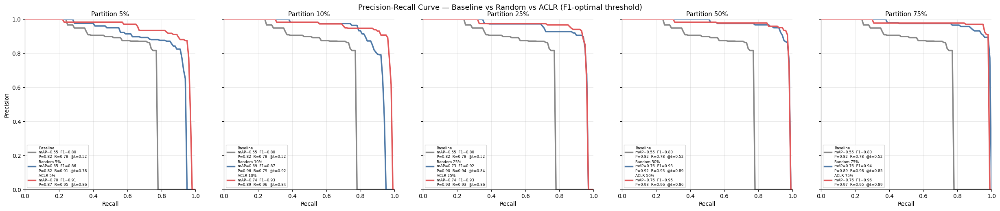

In [46]:
plot_pr_curves_partitions(
    results    = results_seed0,
    df_metrics = df_seed0_eval,
    partitions = ["5", "10", "25", "50", "75"],
    seed       = 0,
    title      = "Precision-Recall Curve — Baseline vs Random vs ACLR (F1-optimal threshold)",
    #save_path  = "pr_curves_f1optimal.pdf",
)

In [23]:
dataset.delete_evaluations()

## Area Size of predictions

[1] D. Hoiem, Y. Chodpathumwan, and Q. Dai, **‘Diagnosing Error in Object Detectors’**, in Computer Vision – ECCV 2012, vol. 7574, A. Fitzgibbon, S. Lazebnik, P. Perona, Y. Sato, and C. Schmid, Eds, in Lecture Notes in Computer Science, vol. 7574. , Berlin, Heidelberg: Springer Berlin Heidelberg, 2012, pp. 340–353. doi: 10.1007/978-3-642-33712-3_25.


Percentile thresholds (relative area):
  p10 = 0.000309  (×10⁻³: 0.3086)
  p30 = 0.000549  (×10⁻³: 0.5493)
  p70 = 0.001351  (×10⁻³: 1.3508)
  p90 = 0.002235  (×10⁻³: 2.2345)

Category counts:
  XS:  360  (10.0%)
  S:  724  (20.0%)
  M: 1446  (40.0%)
  L:  723  (20.0%)
  XL:  362  (10.0%)


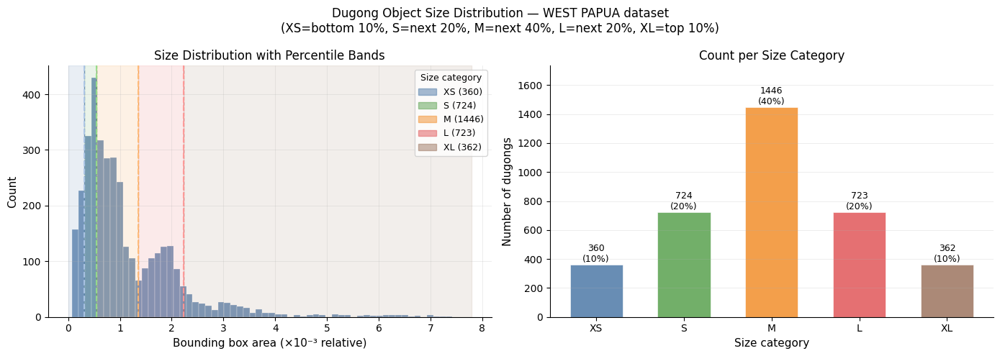

In [42]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ── Extract areas ─────────────────────────────────────────────────────────────
boxes = wp_view.values("ground_truth.detections.bounding_box")

areas = []
for sample_boxes in boxes:
    if sample_boxes:
        for box in sample_boxes:
            w, h = box[2], box[3]
            areas.append(w * h)

areas = np.array(areas)
areas_scaled = areas * 1000

# ── Percentile-based thresholds ───────────────────────────────────────────────
# XS: bottom 10% | S: 10-30% | M: 30-70% | L: 70-90% | XL: top 10%
p10, p30, p70, p90 = np.percentile(areas, [10, 30, 70, 90])

def assign_size_category(area):
    if area < p10:   return "XS"
    elif area < p30: return "S"
    elif area < p70: return "M"
    elif area < p90: return "L"
    else:            return "XL"

categories   = np.array([assign_size_category(a) for a in areas])
cat_order    = ["XS", "S", "M", "L", "XL"]
cat_colors   = ["#4e79a7", "#59a14f", "#f28e2b", "#e15759", "#9c755f"]
cat_counts   = {c: (categories == c).sum() for c in cat_order}
thresholds   = [p10, p30, p70, p90]
thresh_labels = ["p10 (XS/S)", "p30 (S/M)", "p70 (M/L)", "p90 (L/XL)"]
thresh_colors = ["#aec7e8", "#98df8a", "#ffbb78", "#ff9896"]

print("Percentile thresholds (relative area):")
print(f"  p10 = {p10:.6f}  (×10⁻³: {p10*1000:.4f})")
print(f"  p30 = {p30:.6f}  (×10⁻³: {p30*1000:.4f})")
print(f"  p70 = {p70:.6f}  (×10⁻³: {p70*1000:.4f})")
print(f"  p90 = {p90:.6f}  (×10⁻³: {p90*1000:.4f})")
print(f"\nCategory counts:")
for c in cat_order:
    n = cat_counts[c]
    print(f"  {c}: {n:4d}  ({100*n/len(areas):.1f}%)")

# ── Plot ──────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Left — histogram with size bands shaded
ax = axes[0]
_, bin_edges, _ = ax.hist(areas_scaled, bins=60,
                           color="#4e79a7", alpha=0.75,
                           edgecolor="white", linewidth=0.3)

# Shade size bands
band_limits = [0, p10*1000, p30*1000, p70*1000, p90*1000, areas_scaled.max()*1.05]
band_names  = ["XS", "S", "M", "L", "XL"]
for i, (xlo, xhi, name, color) in enumerate(zip(
        band_limits[:-1], band_limits[1:], band_names, cat_colors)):
    ax.axvspan(xlo, xhi, alpha=0.12, color=color, label=f"{name}")
    if i < 4:   # skip the last boundary (right edge of XL — no line needed)
        ax.axvline(xhi, color=color, linewidth=1, linestyle="--", alpha=0.7)

for thresh, tlabel, tcolor in zip(thresholds, thresh_labels, thresh_colors):
    ax.axvline(thresh * 1000, color=tcolor, linewidth=1.5,
               linestyle="--", alpha=0.9)

ax.set_xlabel("Bounding box area (×10⁻³ relative)", fontsize=11)
ax.set_ylabel("Count", fontsize=11)
ax.set_title("Size Distribution with Percentile Bands", fontsize=12)
ax.grid(True, linewidth=0.4, alpha=0.4)
ax.spines[["top", "right"]].set_visible(False)

legend_handles = [mpatches.Patch(color=c, alpha=0.5, label=f"{n} ({cat_counts[n]})")
                  for n, c in zip(cat_order, cat_colors)]
ax.legend(handles=legend_handles, fontsize=9, title="Size category",
          title_fontsize=9, loc="upper right")

# Right — bar chart of category counts
ax = axes[1]
counts = [cat_counts[c] for c in cat_order]
bars = ax.bar(cat_order, counts, color=cat_colors, alpha=0.85,
              edgecolor="white", linewidth=0.5, width=0.6)

for bar, count in zip(bars, counts):
    pct = 100 * count / len(areas)
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 5,
            f"{count}\n({pct:.0f}%)",
            ha="center", va="bottom", fontsize=9)

ax.set_xlabel("Size category", fontsize=11)
ax.set_ylabel("Number of dugongs", fontsize=11)
ax.set_title("Count per Size Category", fontsize=12)
ax.grid(True, axis="y", linewidth=0.4, alpha=0.4)
ax.spines[["top", "right"]].set_visible(False)
ax.set_ylim(0, max(counts) * 1.2)

fig.suptitle(
    "Dugong Object Size Distribution — WEST PAPUA dataset\n"
    "(XS=bottom 10%, S=next 20%, M=next 40%, L=next 20%, XL=top 10%)",
    fontsize=12
)
plt.tight_layout()
#plt.savefig("bbox_size_distribution_percentile.pdf", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
from fiftyone import ViewField as F

# Use baseline eval patches as starting point
eval_patches = test_view_seed0.to_evaluation_patches("baseline_SEED0_nms")

# Check one TP sample — does it have GT box and pred box?
tp_sample = eval_patches.match(F("type") == "tp").first()
print("GT box:",   tp_sample.ground_truth.detections[0].bounding_box)
print("Pred box:", tp_sample["NNN_NC_SEED0_augm_0422_2254conf_50_nms"].detections[0].bounding_box)

# Check FN — only GT, no pred
fn_sample = eval_patches.match(F("type") == "fn").first()
print("FN GT box:", fn_sample.ground_truth.detections[0].bounding_box)
print("FN pred:",   fn_sample["NNN_NC_SEED0_augm_0422_2254conf_50_nms"])  # should be None

/tmp/ipykernel_224274/3402832171.py:102: UserWarning:

'where' used without 'out', expect unitialized memory in output. If this is intentional, use out=None.



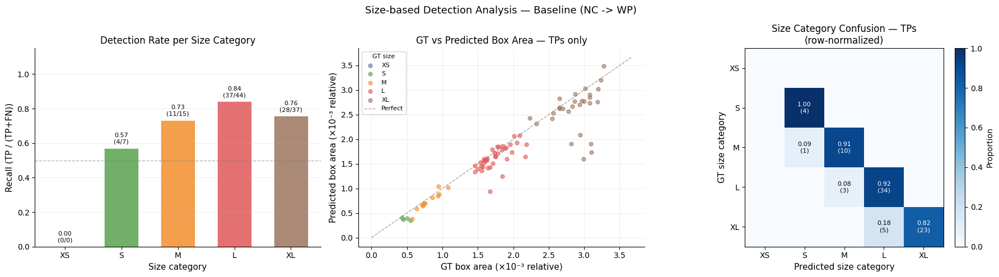

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ── Config ────────────────────────────────────────────────────────────────────
eval_key   = "baseline_SEED0_nms"
pred_field = "NNN_NC_SEED0_augm_0422_2254conf_50_nms"
cat_order  = ["XS", "S", "M", "L", "XL"]
cat_colors = ["#4e79a7", "#59a14f", "#f28e2b", "#e15759", "#9c755f"]

def assign_size_category(area):
    if area < p10:   return "XS"
    elif area < p30: return "S"
    elif area < p70: return "M"
    elif area < p90: return "L"
    else:            return "XL"

# ── Extract TP and FN data from patches ───────────────────────────────────────
eval_patches = test_view_seed0.to_evaluation_patches(eval_key)

tp_gt_areas, tp_pred_areas, tp_cats = [], [], []
fn_gt_areas, fn_cats = [], []

for patch in eval_patches.iter_samples():
    if patch.type == "tp":
        gt_box   = patch.ground_truth.detections[0].bounding_box
        pred_box = patch[pred_field].detections[0].bounding_box
        gt_area   = gt_box[2]   * gt_box[3]
        pred_area = pred_box[2] * pred_box[3]
        tp_gt_areas.append(gt_area)
        tp_pred_areas.append(pred_area)
        tp_cats.append(assign_size_category(gt_area))

    elif patch.type == "fn":
        gt_box  = patch.ground_truth.detections[0].bounding_box
        gt_area = gt_box[2] * gt_box[3]
        fn_gt_areas.append(gt_area)
        fn_cats.append(assign_size_category(gt_area))

tp_gt_areas   = np.array(tp_gt_areas)
tp_pred_areas = np.array(tp_pred_areas)
fn_gt_areas   = np.array(fn_gt_areas)

# ── Plot ──────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# ── Plot 1 — Recall (detection rate) per size category ───────────────────────
ax = axes[0]
tp_count = {c: tp_cats.count(c) for c in cat_order}
fn_count = {c: fn_cats.count(c) for c in cat_order}
recalls  = []
for c in cat_order:
    total = tp_count[c] + fn_count[c]
    recalls.append(tp_count[c] / total if total > 0 else 0)

bars = ax.bar(cat_order, recalls, color=cat_colors, alpha=0.85,
              edgecolor="white", linewidth=0.5, width=0.6)
for bar, rec, c in zip(bars, recalls, cat_order):
    total = tp_count[c] + fn_count[c]
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.02,
            f"{rec:.2f}\n({tp_count[c]}/{total})",
            ha="center", va="bottom", fontsize=8)

ax.axhline(0.5, color="gray", linewidth=1, linestyle="--", alpha=0.6)
ax.set_xlabel("Size category", fontsize=11)
ax.set_ylabel("Recall (TP / (TP+FN))", fontsize=11)
ax.set_title("Detection Rate per Size Category", fontsize=12)
ax.set_ylim(0, 1.15)
ax.grid(True, axis="y", linewidth=0.4, alpha=0.4)
ax.spines[["top", "right"]].set_visible(False)

# ── Plot 2 — GT area vs Predicted area scatter (TPs only) ────────────────────
ax = axes[1]
for cat, color in zip(cat_order, cat_colors):
    mask = np.array(tp_cats) == cat
    ax.scatter(tp_gt_areas[mask]   * 1000,
               tp_pred_areas[mask] * 1000,
               color=color, alpha=0.6, s=25, label=cat, zorder=3)

max_val = max(tp_gt_areas.max(), tp_pred_areas.max()) * 1000 * 1.05
ax.plot([0, max_val], [0, max_val], "--", color="gray", linewidth=1,
        alpha=0.7, label="Perfect")
ax.set_xlabel("GT box area (×10⁻³ relative)", fontsize=11)
ax.set_ylabel("Predicted box area (×10⁻³ relative)", fontsize=11)
ax.set_title("GT vs Predicted Box Area — TPs only", fontsize=12)
ax.legend(fontsize=8, title="GT size", title_fontsize=8)
ax.grid(True, linewidth=0.4, alpha=0.4)
ax.spines[["top", "right"]].set_visible(False)

# ── Plot 3 — Predicted size category vs GT size category heatmap ─────────────
ax = axes[2]
pred_cats_tp = [assign_size_category(a) for a in tp_pred_areas]
heatmap = np.zeros((5, 5))
for gt_cat, pred_cat in zip(tp_cats, pred_cats_tp):
    i = cat_order.index(gt_cat)
    j = cat_order.index(pred_cat)
    heatmap[i, j] += 1

# Normalize by GT category total
row_sums = heatmap.sum(axis=1, keepdims=True)
heatmap_norm = np.divide(heatmap, row_sums, where=row_sums > 0)

im = ax.imshow(heatmap_norm, cmap="Blues", vmin=0, vmax=1)
ax.set_xticks(range(5)); ax.set_xticklabels(cat_order)
ax.set_yticks(range(5)); ax.set_yticklabels(cat_order)
ax.set_xlabel("Predicted size category", fontsize=11)
ax.set_ylabel("GT size category", fontsize=11)
ax.set_title("Size Category Confusion — TPs\n(row-normalized)", fontsize=12)

for i in range(5):
    for j in range(5):
        val = heatmap_norm[i, j]
        n   = int(heatmap[i, j])
        if n > 0:
            ax.text(j, i, f"{val:.2f}\n({n})",
                    ha="center", va="center", fontsize=8,
                    color="white" if val > 0.5 else "black")

plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Proportion")

fig.suptitle(f"Size-based Detection Analysis — Baseline (NC -> WP)", fontsize=13)
plt.tight_layout()
#plt.savefig("size_analysis_baseline.pdf", dpi=300, bbox_inches="tight")
plt.show()

/tmp/ipykernel_224274/3307211657.py:102: UserWarning:

'where' used without 'out', expect unitialized memory in output. If this is intentional, use out=None.



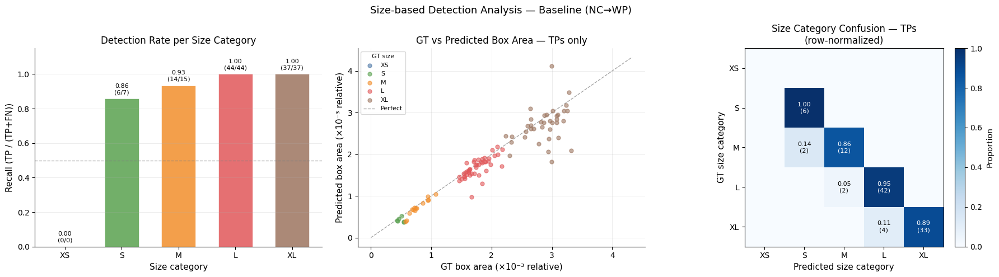

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ── Config ────────────────────────────────────────────────────────────────────
eval_key   = "ACLR_p10_SEED0_nms"
pred_field = "NWW_ACLR_partition_10_SEED0_augm_0429_1026_nms"
cat_order  = ["XS", "S", "M", "L", "XL"]
cat_colors = ["#4e79a7", "#59a14f", "#f28e2b", "#e15759", "#9c755f"]

def assign_size_category(area):
    if area < p10:   return "XS"
    elif area < p30: return "S"
    elif area < p70: return "M"
    elif area < p90: return "L"
    else:            return "XL"

# ── Extract TP and FN data from patches ───────────────────────────────────────
eval_patches = test_view_seed0.to_evaluation_patches(eval_key)

tp_gt_areas, tp_pred_areas, tp_cats = [], [], []
fn_gt_areas, fn_cats = [], []

for patch in eval_patches.iter_samples():
    if patch.type == "tp":
        gt_box   = patch.ground_truth.detections[0].bounding_box
        pred_box = patch[pred_field].detections[0].bounding_box
        gt_area   = gt_box[2]   * gt_box[3]
        pred_area = pred_box[2] * pred_box[3]
        tp_gt_areas.append(gt_area)
        tp_pred_areas.append(pred_area)
        tp_cats.append(assign_size_category(gt_area))

    elif patch.type == "fn":
        gt_box  = patch.ground_truth.detections[0].bounding_box
        gt_area = gt_box[2] * gt_box[3]
        fn_gt_areas.append(gt_area)
        fn_cats.append(assign_size_category(gt_area))

tp_gt_areas   = np.array(tp_gt_areas)
tp_pred_areas = np.array(tp_pred_areas)
fn_gt_areas   = np.array(fn_gt_areas)

# ── Plot ──────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# ── Plot 1 — Recall (detection rate) per size category ───────────────────────
ax = axes[0]
tp_count = {c: tp_cats.count(c) for c in cat_order}
fn_count = {c: fn_cats.count(c) for c in cat_order}
recalls  = []
for c in cat_order:
    total = tp_count[c] + fn_count[c]
    recalls.append(tp_count[c] / total if total > 0 else 0)

bars = ax.bar(cat_order, recalls, color=cat_colors, alpha=0.85,
              edgecolor="white", linewidth=0.5, width=0.6)
for bar, rec, c in zip(bars, recalls, cat_order):
    total = tp_count[c] + fn_count[c]
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.02,
            f"{rec:.2f}\n({tp_count[c]}/{total})",
            ha="center", va="bottom", fontsize=8)

ax.axhline(0.5, color="gray", linewidth=1, linestyle="--", alpha=0.6)
ax.set_xlabel("Size category", fontsize=11)
ax.set_ylabel("Recall (TP / (TP+FN))", fontsize=11)
ax.set_title("Detection Rate per Size Category", fontsize=12)
ax.set_ylim(0, 1.15)
ax.grid(True, axis="y", linewidth=0.4, alpha=0.4)
ax.spines[["top", "right"]].set_visible(False)

# ── Plot 2 — GT area vs Predicted area scatter (TPs only) ────────────────────
ax = axes[1]
for cat, color in zip(cat_order, cat_colors):
    mask = np.array(tp_cats) == cat
    ax.scatter(tp_gt_areas[mask]   * 1000,
               tp_pred_areas[mask] * 1000,
               color=color, alpha=0.6, s=25, label=cat, zorder=3)

max_val = max(tp_gt_areas.max(), tp_pred_areas.max()) * 1000 * 1.05
ax.plot([0, max_val], [0, max_val], "--", color="gray", linewidth=1,
        alpha=0.7, label="Perfect")
ax.set_xlabel("GT box area (×10⁻³ relative)", fontsize=11)
ax.set_ylabel("Predicted box area (×10⁻³ relative)", fontsize=11)
ax.set_title("GT vs Predicted Box Area — TPs only", fontsize=12)
ax.legend(fontsize=8, title="GT size", title_fontsize=8)
ax.grid(True, linewidth=0.4, alpha=0.4)
ax.spines[["top", "right"]].set_visible(False)

# ── Plot 3 — Predicted size category vs GT size category heatmap ─────────────
ax = axes[2]
pred_cats_tp = [assign_size_category(a) for a in tp_pred_areas]
heatmap = np.zeros((5, 5))
for gt_cat, pred_cat in zip(tp_cats, pred_cats_tp):
    i = cat_order.index(gt_cat)
    j = cat_order.index(pred_cat)
    heatmap[i, j] += 1

# Normalize by GT category total
row_sums = heatmap.sum(axis=1, keepdims=True)
heatmap_norm = np.divide(heatmap, row_sums, where=row_sums > 0)

im = ax.imshow(heatmap_norm, cmap="Blues", vmin=0, vmax=1)
ax.set_xticks(range(5)); ax.set_xticklabels(cat_order)
ax.set_yticks(range(5)); ax.set_yticklabels(cat_order)
ax.set_xlabel("Predicted size category", fontsize=11)
ax.set_ylabel("GT size category", fontsize=11)
ax.set_title("Size Category Confusion — TPs\n(row-normalized)", fontsize=12)

for i in range(5):
    for j in range(5):
        val = heatmap_norm[i, j]
        n   = int(heatmap[i, j])
        if n > 0:
            ax.text(j, i, f"{val:.2f}\n({n})",
                    ha="center", va="center", fontsize=8,
                    color="white" if val > 0.5 else "black")

plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Proportion")

fig.suptitle(f"Size-based Detection Analysis — Baseline (NC→WP)", fontsize=13)
plt.tight_layout()
#plt.savefig("size_analysis_baseline.pdf", dpi=300, bbox_inches="tight")
plt.show()

In [39]:
# Compare total patch counts
baseline_patches = test_view_seed0.to_evaluation_patches("baseline_SEED0_nms")
aclr_patches     = test_view_seed0.to_evaluation_patches("ACLR_p10_SEED0_nms")

print("Baseline patches:", len(baseline_patches))
print("ACLR patches:    ", len(aclr_patches))

print("\nBaseline type counts:", baseline_patches.count_values("type"))
print("ACLR type counts:    ", aclr_patches.count_values("type"))

# Check total GT dugongs in test view directly
gt_count = sum(
    len(s.ground_truth.detections)
    for s in test_view_seed0.iter_samples()
    if s.ground_truth and s.ground_truth.detections
)
print(f"\nDirect GT count in test_view_seed0: {gt_count}")

Baseline patches: 122
ACLR patches:     243

Baseline type counts: {'fn': 23, 'tp': 80, 'fp': 19}
ACLR type counts:     {'fp': 140, 'tp': 101, 'fn': 2}

Direct GT count in test_view_seed0: 103


In [40]:
# How many XS dugongs are actually in the test set?
test_areas = []
for s in test_view_seed0.iter_samples():
    if s.ground_truth and s.ground_truth.detections:
        for det in s.ground_truth.detections:
            w, h = det.bounding_box[2], det.bounding_box[3]
            test_areas.append(w * h)

test_areas = np.array(test_areas)
print(f"Test set GT count: {len(test_areas)}")
print(f"XS (< p10={p10:.6f}): {(test_areas < p10).sum()}")
print(f"S  : {((test_areas >= p10) & (test_areas < p30)).sum()}")
print(f"M  : {((test_areas >= p30) & (test_areas < p70)).sum()}")
print(f"L  : {((test_areas >= p70) & (test_areas < p90)).sum()}")
print(f"XL : {(test_areas >= p90).sum()}")
print(f"\nTest set p10: {np.percentile(test_areas, 10):.6f}")
print(f"Full dataset p10: {p10:.6f}")

Test set GT count: 103
XS (< p10=0.000309): 0
S  : 7
M  : 15
L  : 44
XL : 37

Test set p10: 0.000688
Full dataset p10: 0.000309


## Confidence Score Distribution

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

def plot_confidence_grid(
    results: dict,
    df_metrics: pd.DataFrame,
    rows: list,
    baseline_key: str = "baseline_SEED0_nms",
    save_path: str = None,
):
    """
    Args:
        results     : {eval_key: COCODetectionResults}
        df_metrics  : DataFrame with columns [eval_key, threshold, f1, precision, recall]
        rows        : list of (pct_label, random_key, aclr_key)
        baseline_key: eval key for the baseline model
    """
    COLOR_TP    = "#4e79a7"
    COLOR_FP    = "#e15759"
    COLOR_THRESH = "#2ca02c"
    bins        = np.linspace(0, 1, 20)
    n_rows      = len(rows)
    n_cols      = 3

    fig, axes = plt.subplots(n_rows, n_cols,
                              figsize=(13, 4 * n_rows),
                              sharey=False, sharex=True)

    def get_threshold(eval_key):
        """Look up F1-optimal threshold from df_metrics."""
        if df_metrics is not None and eval_key in df_metrics["eval_key"].values:
            return df_metrics[df_metrics["eval_key"] == eval_key].iloc[0]["threshold"]
        return None

    def plot_conf(ax, eval_key, title):
        res   = results[eval_key]
        ytrue = np.array(res.ytrue)
        confs = np.array([v if v is not None else np.nan for v in res.confs], dtype=float)
        ious  = np.array([v if v is not None else 0.0    for v in res.ious],  dtype=float)

        pred_mask = ~np.isnan(confs)
        tp_confs  = confs[pred_mask & (ytrue == "Dugong") & (ious >= 0.5)]
        fp_confs  = confs[pred_mask & (ytrue == "(none)")]

        ax.hist(tp_confs, bins=bins, color=COLOR_TP, alpha=0.6,
                label=f"TP (n={len(tp_confs)})", density=True)
        ax.hist(fp_confs, bins=bins, color=COLOR_FP, alpha=0.6,
                label=f"FP (n={len(fp_confs)})", density=True)

        if len(tp_confs) > 0:
            ax.axvline(np.median(tp_confs), color=COLOR_TP,
                       linewidth=1.2, linestyle="--", alpha=0.7)
        if len(fp_confs) > 0:
            ax.axvline(np.median(fp_confs), color=COLOR_FP,
                       linewidth=1.2, linestyle="--", alpha=0.7)

        # ── F1-optimal threshold line ──────────────────────────────────────
        thresh = get_threshold(eval_key)
        if thresh is not None:
            row = df_metrics[df_metrics["eval_key"] == eval_key].iloc[0]
            ax.axvline(thresh, color=COLOR_THRESH, linewidth=2.0,
                       linestyle="-",
                       label=f"F1-thresh={thresh:.2f}\n"
                             f"F1={row['f1']:.2f}  "
                             f"P={row['precision']:.2f}  "
                             f"R={row['recall']:.2f}")

        ax.set_title(title, fontsize=10)
        ax.legend(fontsize=6.5, loc="upper left", framealpha=0.9)
        ax.grid(True, linewidth=0.4, alpha=0.5)
        ax.spines[["top", "right"]].set_visible(False)

    for row_idx, (pct, random_key, aclr_key) in enumerate(rows):

        plot_conf(axes[row_idx, 0],
                  baseline_key,
                  "Baseline (NC→WP)" if row_idx == 0 else "")

        plot_conf(axes[row_idx, 1], random_key, f"Random {pct}")
        plot_conf(axes[row_idx, 2], aclr_key,   f"ACLR {pct}")

        axes[row_idx, 0].set_ylabel(f"Partition {pct}\nDensity", fontsize=10)

    # Column headers on first row only
    for ax, header in zip(axes[0], ["Baseline", "Random", "ACLR"]):
        ax.set_title(header, fontsize=11, fontweight="bold", pad=12)

    # X label on bottom row only
    for ax in axes[-1]:
        ax.set_xlabel("Confidence score", fontsize=10)

    fig.suptitle(
        "Confidence Distribution — TP vs FP\n"
        "Baseline vs Random vs ACLR  |  green line = F1-optimal threshold",
        fontsize=13, y=1.01
    )
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()
    

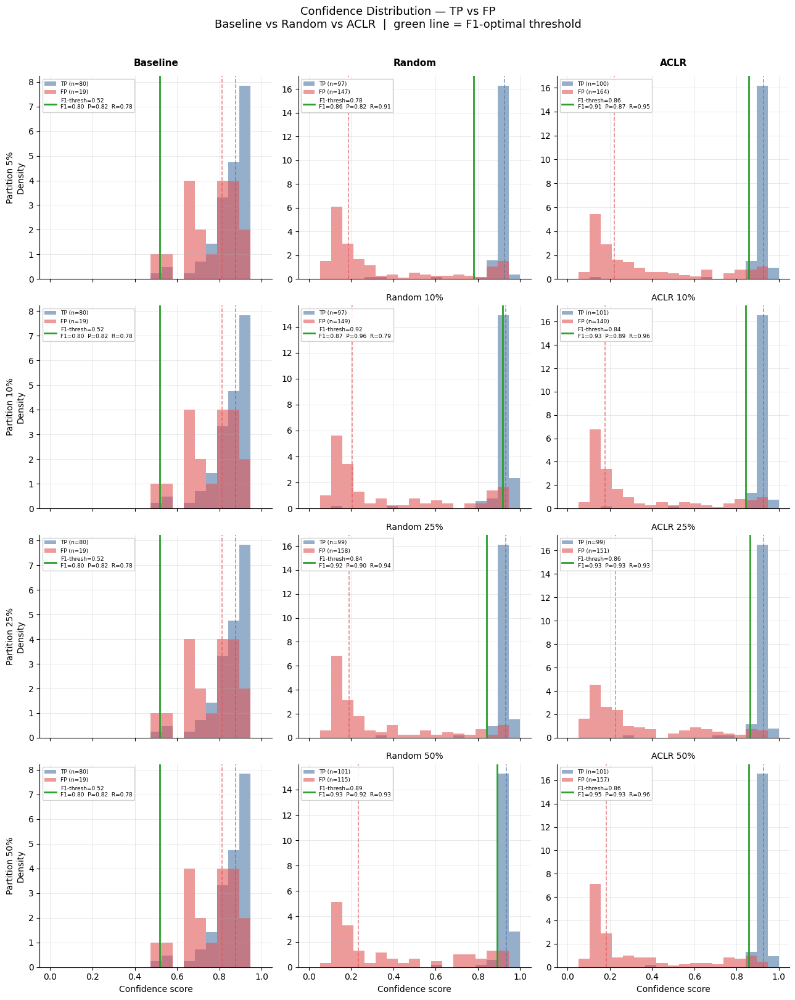

In [ ]:
rows = [
    ("5%",  "p5_SEED0_nms",  "ACLR_p5_SEED0_nms"),
    ("10%", "p10_SEED0_nms", "ACLR_p10_SEED0_nms"),
    ("25%", "p25_SEED0_nms", "ACLR_p25_SEED0_nms"),
    ("50%", "p50_SEED0_nms", "ACLR_p50_SEED0_nms"),
    ("75%", "p75_SEED0_nms", "ACLR_p75_SEED0_nms")
]

plot_confidence_grid(
    results      = results_seed0,
    df_metrics   = df_seed0_eval,
    rows         = rows,
    baseline_key = "baseline_SEED0_nms",
    #save_path    = "confidence_distribution_f1optimal.pdf",
)

## FP TP FN count

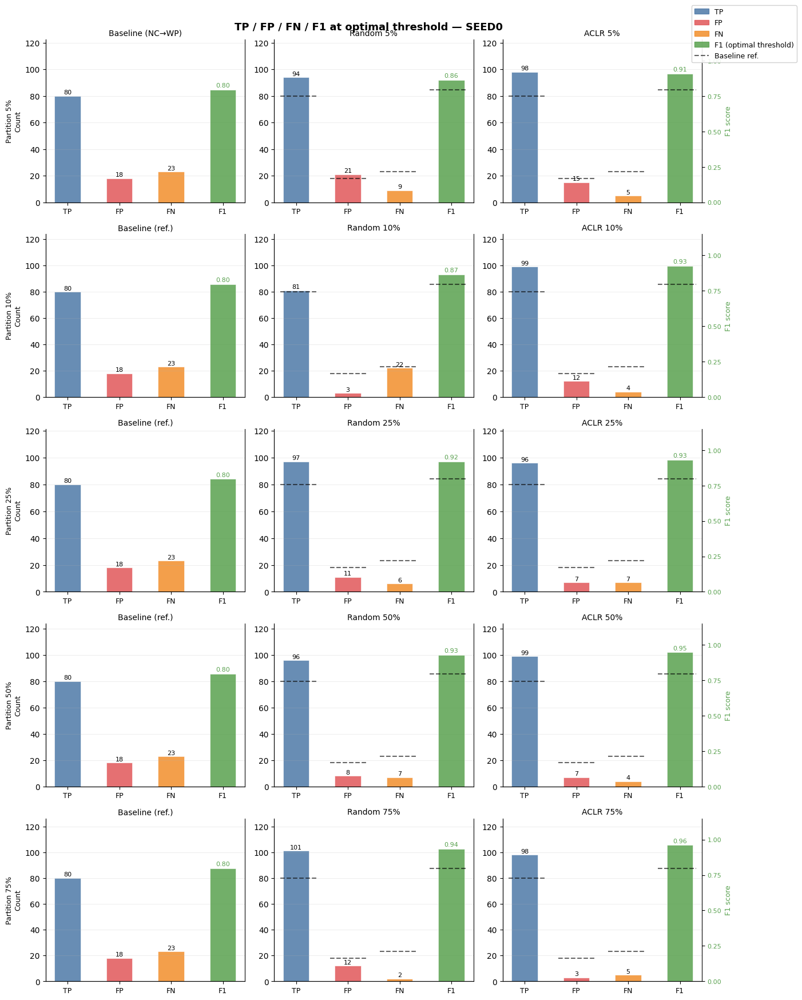

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd

# ── Load precomputed metrics at optimal F1 threshold ─────────────────────────
# df_seed0_eval already has tp/fp/fn/f1 at the best threshold per eval_key
df = df_seed0_eval.set_index("eval_key")

def get_metrics(eval_key):
    row = df.loc[eval_key]
    return int(row["tp"]), int(row["fp"]), int(row["fn"]), float(row["f1"])

# ── Config ────────────────────────────────────────────────────────────────────
partitions = ["5%", "10%", "25%", "50%", "75%"]
models = {
    "5%":  {"random": "p5_SEED0_nms",   "aclr": "ACLR_p5_SEED0_nms"},
    "10%": {"random": "p10_SEED0_nms",  "aclr": "ACLR_p10_SEED0_nms"},
    "25%": {"random": "p25_SEED0_nms",  "aclr": "ACLR_p25_SEED0_nms"},
    "50%": {"random": "p50_SEED0_nms",  "aclr": "ACLR_p50_SEED0_nms"},
    "75%": {"random": "p75_SEED0_nms",  "aclr": "ACLR_p75_SEED0_nms"},
}
baseline_key = "baseline_SEED0_nms"

COLOR_TP  = "#4e79a7"
COLOR_FP  = "#e15759"
COLOR_FN  = "#f28e2b"
COLOR_F1  = "#59a14f"

metrics_left = ["TP", "FP", "FN"]
colors_left  = [COLOR_TP, COLOR_FP, COLOR_FN]
x_left       = np.arange(len(metrics_left))   # [0, 1, 2]
x_f1         = len(metrics_left)              # 3

n_rows, n_cols = len(partitions), 3
bar_width = 0.5

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(13, 3.5 * n_rows),
    sharey=False,
)

def plot_bar(ax, tp, fp, fn, f1, title,
             show_baseline=None, is_last_col=False):
    vals = [tp, fp, fn]
    bars = ax.bar(x_left, vals, width=bar_width,
                  color=colors_left, alpha=0.85,
                  edgecolor="white", linewidth=0.5)

    for bar, val in zip(bars, vals):
        ax.text(bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.5,
                str(val), ha="center", va="bottom", fontsize=8)

    if show_baseline:
        b_tp, b_fp, b_fn, _ = show_baseline
        for xi, ref in zip(x_left, [b_tp, b_fp, b_fn]):
            ax.axhline(ref,
                       xmin=(xi) / (x_f1 + 1) + 0.03,
                       xmax=(xi + 1) / (x_f1 + 1) - 0.03,
                       color="black", linewidth=1.5,
                       linestyle="--", alpha=0.6)

    ax.set_xticks(list(x_left) + [x_f1])
    ax.set_xticklabels(metrics_left + ["F1"], fontsize=9)
    ax.set_title(title, fontsize=10, pad=5)
    ax.grid(True, axis="y", linewidth=0.4, alpha=0.4)
    ax.spines[["top", "right"]].set_visible(False)

    # ── right axis: F1 ───────────────────────────────────────────────────
    ax2 = ax.twinx()
    ax2.bar(x_f1, f1, width=bar_width,
            color=COLOR_F1, alpha=0.85,
            edgecolor="white", linewidth=0.5)
    ax2.text(x_f1, f1 + 0.01, f"{f1:.2f}",
             ha="center", va="bottom", fontsize=8, color=COLOR_F1)

    if show_baseline:
        _, _, _, b_f1 = show_baseline
        ax2.axhline(b_f1,
                    xmin=(x_f1) / (x_f1 + 1) + 0.03,
                    xmax=(x_f1 + 1) / (x_f1 + 1) - 0.03,
                    color="black", linewidth=1.5,
                    linestyle="--", alpha=0.6)

    ax2.set_ylim(0, 1.15)
    ax2.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
    ax2.spines[["top"]].set_visible(False)

    if is_last_col:
        ax2.set_ylabel("F1 score", fontsize=9, color=COLOR_F1)
        ax2.tick_params(axis="y", labelcolor=COLOR_F1, labelsize=8)
    else:
        ax2.set_yticklabels([])
        ax2.tick_params(axis="y", length=0)

    return ax2

# ── Baseline (read from df) ───────────────────────────────────────────────────
b_tp, b_fp, b_fn, b_f1 = get_metrics(baseline_key)

for row_idx, pct in enumerate(partitions):
    r_tp, r_fp, r_fn, r_f1 = get_metrics(models[pct]["random"])
    a_tp, a_fp, a_fn, a_f1 = get_metrics(models[pct]["aclr"])

    all_counts   = [b_tp, b_fp, b_fn, r_tp, r_fp, r_fn, a_tp, a_fp, a_fn]
    y_max_counts = max(all_counts) * 1.25

    plot_bar(axes[row_idx, 0], b_tp, b_fp, b_fn, b_f1,
             title="Baseline (NC→WP)" if row_idx == 0 else "Baseline (ref.)",
             show_baseline=None, is_last_col=False)
    axes[row_idx, 0].set_ylim(0, y_max_counts)
    axes[row_idx, 0].set_ylabel(f"Partition {pct}\nCount", fontsize=9)

    plot_bar(axes[row_idx, 1], r_tp, r_fp, r_fn, r_f1,
             title=f"Random {pct}",
             show_baseline=(b_tp, b_fp, b_fn, b_f1), is_last_col=False)
    axes[row_idx, 1].set_ylim(0, y_max_counts)

    plot_bar(axes[row_idx, 2], a_tp, a_fp, a_fn, a_f1,
             title=f"ACLR {pct}",
             show_baseline=(b_tp, b_fp, b_fn, b_f1), is_last_col=True)
    axes[row_idx, 2].set_ylim(0, y_max_counts)

# ── Legend ────────────────────────────────────────────────────────────────────
legend_handles = [
    mpatches.Patch(color=COLOR_TP, alpha=0.85, label="TP"),
    mpatches.Patch(color=COLOR_FP, alpha=0.85, label="FP"),
    mpatches.Patch(color=COLOR_FN, alpha=0.85, label="FN"),
    mpatches.Patch(color=COLOR_F1, alpha=0.85, label="F1 (optimal threshold)"),
    plt.Line2D([0], [0], color="black", linewidth=1.5,
               linestyle="--", alpha=0.6, label="Baseline ref."),
]
fig.legend(handles=legend_handles, fontsize=9,
           loc="upper right", bbox_to_anchor=(1.08, 1.0), framealpha=0.9)

fig.suptitle("TP / FP / FN / F1 at optimal threshold — SEED0",
             fontsize=13, fontweight="bold")

plt.tight_layout()
plt.show()

## F1 per size category

In [57]:
# Map eval_key → pred_field
eval_to_pred = {v['eval_key']:v['pred_field'] for v in sss_seed0}

## CHECK THE TEST VIEW


## CONSTRUCT THE SIZE BASED ON THE FULL TEST SET
# ── Extract areas ─────────────────────────────────────────────────────────────
boxes = wp_view.values("ground_truth.detections.bounding_box")

areas = []
for sample_boxes in boxes:
    if sample_boxes:
        for box in sample_boxes:
            w, h = box[2], box[3]
            areas.append(w * h)

areas = np.array(areas)
areas_scaled = areas * 1000

# ── Percentile-based thresholds ───────────────────────────────────────────────
# XS: bottom 10% | S: 10-30% | M: 30-70% | L: 70-90% | XL: top 10%
p10, p30, p70, p90 = np.percentile(areas, [10, 30, 70, 90])


# ── Build lookup once for all models ─────────────────────────────────────────
print("Building GT area lookup...")
gt_area_lookup = {}
for sample in test_view_seed0.iter_samples():
    if sample.ground_truth is None:
        continue
    for det in sample.ground_truth.detections:
        w, h = det.bounding_box[2], det.bounding_box[3]
        gt_area_lookup[det.id] = w * h

print(f"GT detections indexed: {len(gt_area_lookup)}")

# Build pred lookup per field
def build_pred_lookup(view, pred_field):
    lookup = {}
    for sample in view.iter_samples():
        preds = sample.get_field(pred_field)
        if preds is None:
            continue
        for det in preds.detections:
            w, h = det.bounding_box[2], det.bounding_box[3]
            lookup[det.id] = w * h
    return lookup



# Build pred lookups once
print("Building pred area lookups...")
pred_area_lookups = {
    eval_key: build_pred_lookup(test_view_seed0, pred_field)
    for eval_key, pred_field in eval_to_pred.items()
}
print("Done.")

def assign_size(area):
    if area < p10:   return "XS"
    elif area < p30: return "S"
    elif area < p70: return "M"
    elif area < p90: return "L"
    else:            return "XL"

def get_sizes(res, eval_key):
    pred_lookup = pred_area_lookups.get(eval_key, {})
    sizes = []
    for gt_id, pred_id in zip(res.ytrue_ids, res.ypred_ids):
        if gt_id is not None and gt_id in gt_area_lookup:
            area = gt_area_lookup[gt_id]
        elif pred_id is not None and pred_id in pred_lookup:
            area = pred_lookup[pred_id]
        else:
            area = (p30 + p70) / 2  # fallback to M
        sizes.append(assign_size(area))
    return np.array(sizes)

# Verify on baseline
sizes_baseline = get_sizes(results_seed0["baseline_SEED0_nms"], "baseline_SEED0_nms")
from collections import Counter
print("Size distribution in baseline results:", Counter(sizes_baseline))

Building GT area lookup...


GT detections indexed: 103
Building pred area lookups...
Done.
Size distribution in baseline results: Counter({np.str_('L'): 44, np.str_('XL'): 37, np.str_('M'): 20, np.str_('S'): 11, np.str_('XS'): 10})


In [59]:
def compute_f1_per_size(results, df_metrics, iou_thresh=0.5):
    """
    For each eval_key, apply its F1-optimal threshold and compute
    TP/FP/FN/F1 per size category.
    """
    cat_order = ["XS", "S", "M", "L", "XL"]
    rows = []

    for eval_key, res in results.items():
        if eval_key not in df_metrics["eval_key"].values:
            continue
        thresh = df_metrics[df_metrics["eval_key"] == eval_key].iloc[0]["threshold"]

        ytrue  = np.array(res.ytrue)
        confs  = np.array([v if v is not None else 0.0 for v in res.confs], dtype=float)
        ious   = np.array([v if v is not None else 0.0 for v in res.ious],  dtype=float)
        ypred  = np.array(res.ypred)
        sizes  = get_sizes(res, eval_key)

        pred_mask = ypred != "(none)"
        keep      = pred_mask & (confs >= thresh)

        for cat in cat_order:
            cat_mask = sizes == cat

            tp = int(((ytrue == "Dugong") & (ious >= iou_thresh) & keep & cat_mask).sum())
            fp = int(((ytrue == "(none)") & keep & cat_mask).sum())
            fn = int(((ytrue == "Dugong") & (
                (~keep) | (ious < iou_thresh)
            ) & cat_mask).sum())

            precision = tp / (tp + fp + 1e-9)
            recall    = tp / (tp + fn + 1e-9)
            f1        = 2 * precision * recall / (precision + recall + 1e-9)

            rows.append(dict(
                eval_key=eval_key, size_cat=cat,
                tp=tp, fp=fp, fn=fn,
                precision=precision, recall=recall, f1=f1,
            ))

    return pd.DataFrame(rows)




In [61]:
def plot_f1_per_size(
    df_size: pd.DataFrame,
    partitions: list = ["5", "10", "25", "50", "75"],
    seed: int = 0,
    save_path: str = None,
):
    cat_order      = ["XS", "S", "M", "L", "XL"]
    cat_colors_bg  = ["#d0e4f7", "#d5edda", "#fde8c8", "#fcd5d5", "#e8ddd5"]
    COLOR_BASELINE = "#888888"
    COLOR_RANDOM   = "#4e79a7"
    COLOR_ACLR     = "#e15759"
    x     = np.arange(len(cat_order))
    width = 0.25

    fig, axes = plt.subplots(1, len(partitions),
                              figsize=(5 * len(partitions), 5),
                              sharey=True)

    for ax, p in zip(axes, partitions):
        baseline_key = f"baseline_SEED{seed}_nms"
        random_key   = f"p{p}_SEED{seed}_nms"
        aclr_key     = f"ACLR_p{p}_SEED{seed}_nms"

        for offset, (eval_key, label, color) in enumerate([
            (baseline_key, "Baseline",    COLOR_BASELINE),
            (random_key,   f"Rnd {p}%",  COLOR_RANDOM),
            (aclr_key,     f"ACLR {p}%", COLOR_ACLR),
        ]):
            sub     = df_size[df_size["eval_key"] == eval_key]
            f1_vals = [
                sub[sub["size_cat"] == c]["f1"].values[0]
                if len(sub[sub["size_cat"] == c]) > 0 else 0.0
                for c in cat_order
            ]
            bars = ax.bar(x + (offset - 1) * width, f1_vals,
                          width=width, color=color, alpha=0.85,
                          edgecolor="white", linewidth=0.5, label=label)

            for bar, val in zip(bars, f1_vals):
                if val > 0.05:
                    ax.text(bar.get_x() + bar.get_width() / 2,
                            bar.get_height() + 0.01,
                            f"{val:.2f}", ha="center", va="bottom",
                            fontsize=6, rotation=90)

        # Shade size category backgrounds
        for i, bg in enumerate(cat_colors_bg):
            ax.axvspan(i - 0.5, i + 0.5, alpha=0.08, color=bg, zorder=0)

        ax.set_xticks(x)
        ax.set_xticklabels(cat_order, fontsize=10)
        ax.set_title(f"Partition {p}%", fontsize=11)
        ax.set_ylim(0, 1.18)
        ax.axhline(0.5, color="gray", linewidth=0.8,
                   linestyle="--", alpha=0.5)
        ax.legend(fontsize=7, loc="lower right")
        ax.grid(True, axis="y", linewidth=0.4, alpha=0.4)
        ax.spines[["top", "right"]].set_visible(False)

    axes[0].set_ylabel("F1 @ F1-optimal threshold", fontsize=11)
    fig.suptitle(
        "F1 Score per Size Category — Baseline vs Random vs ACLR\n"
        "(XS=bottom 10%, S=next 20%, M=next 40%, L=next 20%, XL=top 10%)",
        fontsize=12
    )
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()



size_cat  tp  fp  fn       f1
      XS   0   9   0 0.000000
       S   4   4   3 0.533333
       M  11   5   4 0.709677
       L  37   0   7 0.913580
      XL  28   0   9 0.861538


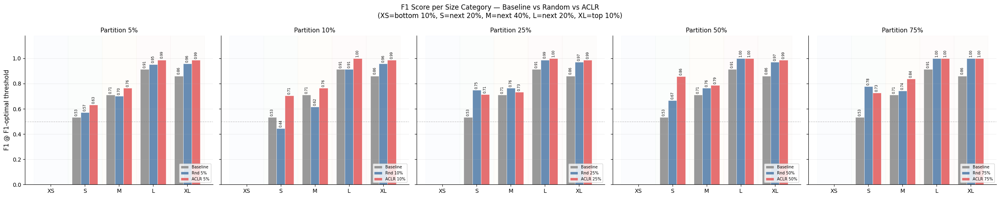

In [62]:
# ── Compute ───────────────────────────────────────────────────────────────────
df_size = compute_f1_per_size(results_seed0, 
                              df_seed0_eval
                              )
print(df_size[df_size["eval_key"] == "baseline_SEED0_nms"]
      [["size_cat", "tp", "fp", "fn", "f1"]].to_string(index=False))

plot_f1_per_size(df_size, 
                 #save_path="f1_per_size.pdf"
                 )

## F1 vs Partition Size

In [ ]:
def plot_f1_vs_partition(
    df_metrics: pd.DataFrame,
    seed: int = 0,
    metric: str = "f1",
    save_path: str = None,
):
    partitions   = [5, 10, 25, 50, 75, 100]
    COLOR_RANDOM = "#4e79a7"
    COLOR_ACLR   = "#e15759"

    fig, ax = plt.subplots(figsize=(8, 5))

    # Baseline reference
    b_row = df_metrics[df_metrics["eval_key"] == f"baseline_SEED{seed}_nms"]
    if not b_row.empty:
        b_val = b_row.iloc[0][metric]
        ax.axhline(b_val, color="#888888", linewidth=2, linestyle="--",
                   label=f"Baseline ({metric.upper()}={b_val:.3f})", zorder=2)
        ax.fill_between([0, 108], b_val - 0.005, b_val + 0.005,
                        color="#888888", alpha=0.15)

    random_vals, aclr_vals = [], []
    for p in partitions:
        r_row = df_metrics[df_metrics["eval_key"] == f"p{p}_SEED{seed}_nms"]
        a_row = df_metrics[df_metrics["eval_key"] == f"ACLR_p{p}_SEED{seed}_nms"]
        random_vals.append(r_row.iloc[0][metric] if not r_row.empty else np.nan)
        aclr_vals.append(  a_row.iloc[0][metric] if not a_row.empty else np.nan)

    ax.plot(partitions, random_vals, color=COLOR_RANDOM, linewidth=2.5,
            marker="o", markersize=8, label="Random", zorder=3)
    ax.plot(partitions, aclr_vals,   color=COLOR_ACLR,   linewidth=2.5,
            marker="s", markersize=8, label="ACLR",   zorder=3)

    # Annotate points
    for p, rv, av in zip(partitions, random_vals, aclr_vals):
        if not np.isnan(rv):
            ax.annotate(f"{rv:.3f}", (p, rv),
                        textcoords="offset points", xytext=(0, 9),
                        ha="center", fontsize=8, color=COLOR_RANDOM)
        if not np.isnan(av):
            ax.annotate(f"{av:.3f}", (p, av),
                        textcoords="offset points", xytext=(0, -15),
                        ha="center", fontsize=8, color=COLOR_ACLR)

    # Shade ACLR advantage region
    r_arr = np.array(random_vals)
    a_arr = np.array(aclr_vals)
    valid = ~(np.isnan(r_arr) | np.isnan(a_arr))
    ax.fill_between(np.array(partitions)[valid],
                    r_arr[valid], a_arr[valid],
                    where=a_arr[valid] >= r_arr[valid],
                    alpha=0.12, color=COLOR_ACLR, label="")
    ax.fill_between(np.array(partitions)[valid],
                    r_arr[valid], a_arr[valid],
                    where=r_arr[valid] >= a_arr[valid],
                    alpha=0.12, color=COLOR_RANDOM, label="")

    all_vals = [v for v in random_vals + aclr_vals if not np.isnan(v)]
    ax.set_xlim(0, 108)
    ax.set_ylim(min(all_vals) * 0.96, max(all_vals) * 1.04)
    ax.set_xticks(partitions)
    ax.set_xticklabels([f"{p}%" for p in partitions])
    ax.set_xlabel("WP training partition (%)", fontsize=12)
    ax.set_ylabel(f"{metric.upper()} @ F1-optimal threshold", fontsize=12)
    ax.set_title(
        f"Data Efficiency — {metric.upper()} vs Partition Size\n"
        f"Random vs ACLR  |  SEED{seed}  |  dashed = Baseline",
        fontsize=13
    )
    ax.legend(fontsize=10, loc="lower right")
    ax.grid(True, linewidth=0.4, alpha=0.5)
    ax.spines[["top", "right"]].set_visible(False)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()



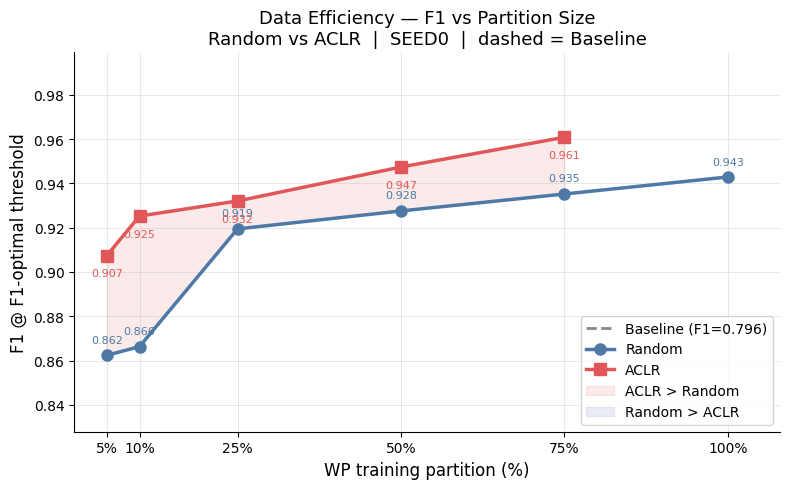

In [64]:
plot_f1_vs_partition(df_seed0_eval, 
                     seed=0, 
                     metric="f1",
                     #save_path="f1_vs_partition.pdf"
                     )

# Active Learning

## Which images are being choosen?


Active Learning Pipeline 

- Representative Clusters
- Uniqueness score

In [23]:
from sklearn.preprocessing import normalize
from sklearn.neighbors import NearestNeighbors

In [ ]:
# filter by the seed, excluding test and val set.
train_wp = wp_view.match(F('tags').contains(f"train_0"))

## get the embeddings relative to the train set.
wp_train_emb = train_wp.values('full_embeddings')
wp_train_emb_norm = normalize(wp_train_emb) #normalize | L2 normalization

## retrieve id of each iamge
wp_train_ids = train_wp.values('filepath')

## compute uniqueness score - based on a weighted NN 
uniqueness_scores = compute_weighted_uniqueness(wp_train_emb_norm)

## retrieve the threshold of uniqueness based on the histgram percentile
chosen_percentile = selector_num_uniqueness(
        partition_size=0.1,
        wp_train_length=750,
        uniqueness=uniqueness_scores,
        ratio_cluster_uniqueness=0.75
    )
print(f"Percentile:{chosen_percentile}")

# Extract Uniqueness Indices
threshold_value = np.percentile(uniqueness_scores, chosen_percentile)
candidate_idx   = np.where(uniqueness_scores >= threshold_value)[0]
print(f"Candidates based on uniqueness: {candidate_idx}")

## From the candidate list, it uses a stochastic sampling to retrieve the properly number

Percentile:96.0
Candidates based on uniqueness: [   7   32  325  374  449  452  469  473  476  488  509  522  531  535
  537  553  573  584  587  595  618  624  628  635  669  684  689  690
  726  730  736  775  776  801  832  865  881  893  909  919 1302 1303
 1304 1305 1306 1307 1308 1309 1310 1311 1312 1463 1541 1542 1543 1544
 1545 1546 1547 1548 1549 1551 1552]


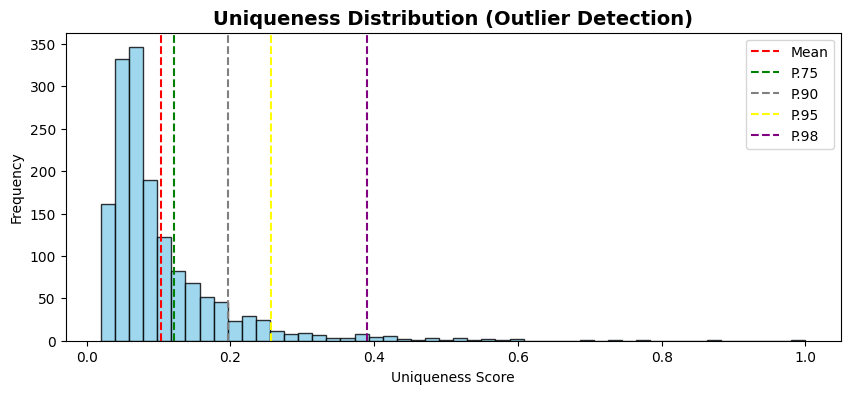

In [37]:
fig, ax = plt.subplots(1,1, figsize=(10,4))
ax.hist(uniqueness_scores, bins=50, color='skyblue', edgecolor='black', alpha=0.8)
ax.axvline(np.mean(uniqueness_scores), color='red', linestyle='dashed', label='Mean')
ax.axvline(np.percentile(uniqueness_scores, q=75), color='green', linestyle='dashed', label='P.75')
ax.axvline(np.percentile(uniqueness_scores, q=90), color='gray', linestyle='dashed', label='P.90')
ax.axvline(np.percentile(uniqueness_scores, q=95), color='yellow', linestyle='dashed', label='P.95')
ax.axvline(np.percentile(uniqueness_scores, q=98), color='purple', linestyle='dashed', label='P.98')
ax.set_title("Uniqueness Distribution (Outlier Detection)", fontsize=14, fontweight='bold')
ax.set_xlabel("Uniqueness Score")
ax.set_ylabel("Frequency")
ax.legend()

In [ ]:
def compute_weighted_uniqueness(embeddings, 
                                weights=[0.9, 0.6, 0.3, 0.1]):
    """
    Computes the Uniqueness score based on a weighted nearest neighboors analysis.
    """
    k = len(weights)
    
    # knn
    #  look for k+1 because the 1st neighbor is always the point itself (dist=0)
    knn = NearestNeighbors(n_neighbors= k + 1,
                            metric='cosine'
                            )
    knn.fit(embeddings)
    
    # extract distances
    # distances shape: (num_samples, k+1)
    distances, _ = knn.kneighbors(embeddings)
    
    # apply the Weights [0.6, 0.3, 0.1]
    # here we slice dists[:, 1:] to ignore the 0-distance to self
    relevant_dists = distances[:, 1:]
    
    # weighted mean
    weighted_dists = np.mean(relevant_dists * weights,
                            axis=1
                            )
    
    # normalize to [0, 1]
    if weighted_dists.max() > 0:
        weighted_dists /= weighted_dists.max()
        
    return weighted_dists

In [44]:
def get_stochastic_uniqueness_representatives(
    uniqueness_scores: np.ndarray,
    candidate_idx: np.ndarray,
    target_count: int,
    temperature_uniqueness: float = 0.5,
    seed: int = 42
) -> np.ndarray:
    """
    Stochastic sampling from the upper-tail uniqueness pool.
    
    Unlike a hard threshold selection, this applies a temperature-scaled
    softmax over the candidate pool so higher-uniqueness samples are 
    preferred but not always the same images are being choosen all the runs.
    This fact implies variability of images. 

    Args:
        uniqueness_scores: Full uniqueness array, shape (N,).
        candidate_idx: Indices of the upper-tail pool (from percentile gate).
        target_count: Number of samples to select.
        temperature_uniqueness: Controls spread within the upper tail.
            - Low  (0.05): near-deterministic, picks highest scores → re-clusters.
            - Med  (0.3-0.5): biased but spread.
            - High (2.0+): near-uniform over upper tail.
        seed: Random seed for reproducibility.

    Returns:
        np.ndarray: Selected indices into the original embeddings array.
    """
    rng = np.random.default_rng(seed)

    candidate_scores = uniqueness_scores[candidate_idx]

    # Softmax with +score (higher uniqueness = higher prob)
    weights = np.exp(candidate_scores / temperature_uniqueness)
    probs   = weights / weights.sum()

    n_to_pick = min(target_count, len(candidate_idx))
    chosen    = rng.choice(len(candidate_idx), 
                           size=n_to_pick, 
                           replace=False, 
                           p=probs
                           )

    return candidate_idx[chosen]

In [38]:
candidates_scores = uniqueness_scores[candidate_idx]
candidates_scores

array([0.38972273, 0.34372645, 0.28845387, 0.77112218, 0.36488011,
       0.32562045, 0.51213653, 0.46855528, 0.51513555, 0.37638148,
       0.38699456, 0.55350017, 0.39641467, 0.36552179, 0.30512557,
       0.41623047, 0.39306991, 0.31489138, 0.43853834, 0.30745052,
       0.28668971, 0.31218105, 0.29583115, 0.31696919, 0.38970565,
       0.31376767, 0.59060694, 0.31127877, 0.2876948 , 0.37092579,
       0.38186715, 0.33993964, 0.30561437, 0.314282  , 0.30103066,
       0.31882693, 0.37404379, 0.31398625, 0.39951849, 0.38502589,
       0.72767479, 0.55710927, 0.59372713, 0.4121605 , 1.        ,
       0.31257175, 0.58027072, 0.49582411, 0.47865419, 0.35082055,
       0.51705733, 0.31499271, 0.48224561, 0.4222171 , 0.69644904,
       0.486564  , 0.40599013, 0.42601895, 0.44983211, 0.53755072,
       0.87764129, 0.41888277, 0.38582697])

In [42]:
weights  = np.exp(candidates_scores / 0.5)
prob = weights / weights.sum()
prob

array([0.01394438, 0.01271884, 0.01138776, 0.02990051, 0.01326848,
       0.0122665 , 0.01781257, 0.01632572, 0.01791973, 0.01357723,
       0.0138685 , 0.01934882, 0.01413227, 0.01328552, 0.01177387,
       0.0147036 , 0.01403804, 0.01200609, 0.01537446, 0.01182874,
       0.01134765, 0.01194119, 0.01155703, 0.01205609, 0.01394391,
       0.01197914, 0.02083939, 0.01191966, 0.01137048, 0.01342989,
       0.01372701, 0.01262287, 0.01178538, 0.01199147, 0.01167783,
       0.01210096, 0.0135139 , 0.01198438, 0.01422027, 0.01381401,
       0.027412  , 0.01948899, 0.02096985, 0.0145844 , 0.04725844,
       0.01195052, 0.02041302, 0.01724081, 0.01665882, 0.01290058,
       0.01798874, 0.01200852, 0.01677891, 0.01488071, 0.02575244,
       0.01692445, 0.01440552, 0.01499429, 0.01572569, 0.01874136,
       0.03699985, 0.0147818 , 0.01383616])

In [48]:
selected_candidates = get_stochastic_uniqueness_representatives(
    uniqueness_scores = uniqueness_scores,
    candidate_idx = candidate_idx,
    target_count = 20,
    temperature_uniqueness = 0.5
)

In [63]:
import matplotlib.image as mpimg


def plot_image_grid(
    image_paths: np.ndarray,
    dataset: fo.Dataset,
    title_field: str = "stratify_key",
    suptitle: str = "Selected Candidates by Uniqueness",
    n_cols: int = 4,
    max_images: int = 20,
    figsize_per_cell: tuple = (3.5, 3.5),
):
    """
    Plot a grid of images with metadata titles from a FiftyOne dataset.

    Args:
        image_paths   : array of absolute image paths (from wp_train_ids[selected_candidates])
        dataset       : FiftyOne dataset to look up metadata fields
        title_field   : sample field to use as subplot title (e.g. "stratify_key", "sea_state")
        suptitle      : overall figure title
        n_cols        : number of columns in the grid
        max_images    : maximum number of images to display
        figsize_per_cell : (w, h) in inches per cell
    """
    paths = image_paths[:max_images]
    n = len(paths)
    n_rows = int(np.ceil(n / n_cols))

    fig_w = figsize_per_cell[0] * n_cols
    fig_h = figsize_per_cell[1] * n_rows + 0.8  # extra space for suptitle

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_w, fig_h))
    axes = axes.flatten()

    for ax_idx, img_path in enumerate(paths):
        ax = axes[ax_idx]

        # ── load and display image ────────────────────────────────────────
        try:
            img = mpimg.imread(img_path)
            ax.imshow(img)
        except Exception as e:
            ax.text(0.5, 0.5, f"Error\n{e}", ha="center", va="center",
                    transform=ax.transAxes, fontsize=7, color="red")

        ax.axis("off")

        # ── fetch title from FiftyOne dataset ─────────────────────────────
        try:
            sample = dataset[img_path]
            field_val = sample.get_field(title_field)
            title = str(field_val) if field_val is not None else Path(img_path).stem[:30]
        except Exception:
            # fallback: use filename stem
            title = Path(img_path).stem[:30]

        ax.set_title(title, fontsize=8, pad=3, wrap=True)

    # ── hide unused axes ──────────────────────────────────────────────────
    for ax_idx in range(n, len(axes)):
        axes[ax_idx].axis("off")

    fig.suptitle(suptitle, fontsize=13, fontweight="bold", y=1.01)
    plt.tight_layout()
    plt.show()
    return fig

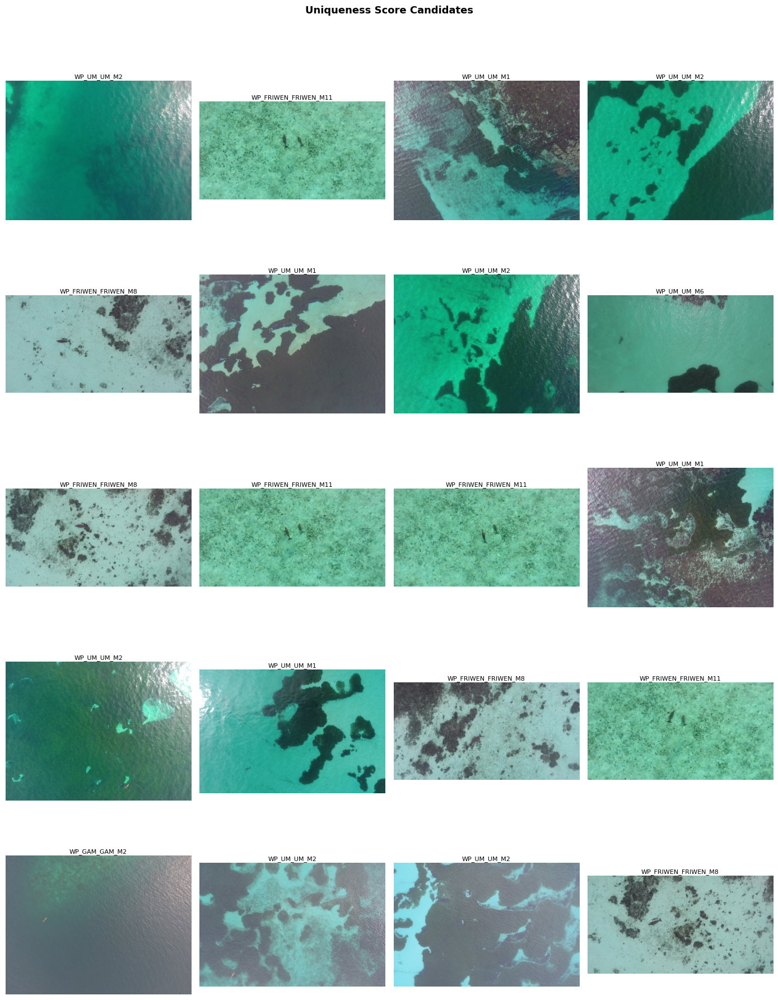

In [65]:
selected_paths = np.array(wp_train_ids)[selected_candidates]

fig = plot_image_grid(
    image_paths=selected_paths,
    dataset=dataset,          # your FiftyOne dataset object
    title_field="stratify_key",
    suptitle="Uniqueness Score Candidates",
    n_cols=4,
    max_images=20,
)

# optionally save
#fig.savefig("uniqueness_candidates.png", dpi=150, bbox_inches="tight")

# Thank you!